# FMCG Demand Forecasting - Decision-Oriented EDA

**Goal:** understand the 14-day store-SKU forecasting problem well enough to choose between global, segmented/local, bottom-up and middle-out approaches without introducing time leakage.

This notebook uses **Plotly** for interactive charts. Every analysis is followed by a *Decision impact* note so the EDA informs model architecture, feature design, validation and production handling.

In [1]:
from pathlib import Path
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

pd.set_option("display.max_columns", 100)
DATA = Path("../data/raw/data.csv")
if not DATA.exists():
    DATA = Path("data/raw/data.csv")
assert DATA.exists(), "Copy the supplied data.csv to data/raw/data.csv"

df = pd.read_csv(DATA, parse_dates=["date"])
df = df.sort_values(["store_id", "sku_id", "date"]).reset_index(drop=True)
print(f"Rows: {len(df):,} | Columns: {df.shape[1]} | {df.date.min().date()} -> {df.date.max().date()}")

Rows: 1,100,000 | Columns: 33 | 2021-01-01 -> 2023-12-31


In [2]:
df.sample(5)

,date,year,month,day,weekofyear,weekday,is_weekend,is_holiday,temperature,rain_mm,store_id,country,city,channel,latitude,longitude,sku_id,sku_name,category,subcategory,brand,units_sold,list_price,discount_pct,promo_flag,gross_sales,net_sales,stock_on_hand,stock_out_flag,lead_time_days,supplier_id,purchase_cost,margin_pct
609375,2022-07-10,2022,7,10,27,6,1,0,12.75,6.74,STORE0007,Spain,Barcelona,Supermarket,41.40154,2.21134,SKU0099,BrandC Toothpaste,Personal Care,Toothpaste,BrandC,84,11.16,0.0,0,937.44,937.44,219,0,2,S032,7.77,0.304
427600,2022-07-05,2022,7,5,27,1,0,0,9.77,3.67,STORE0005,Poland,Warsaw,Hypermarket,52.25287,20.99579,SKU0088,BrandD Shampoo,Personal Care,Shampoo,BrandD,14,10.03,0.0,0,140.42,140.42,162,0,11,S055,5.31,0.471
423900,2021-05-16,2021,5,16,19,6,1,0,14.81,0.78,STORE0005,Poland,Warsaw,Hypermarket,52.25287,20.99579,SKU0085,BrandA Shampoo,Personal Care,Shampoo,BrandA,48,1.57,0.0,0,75.36,75.36,308,0,7,S014,0.89,0.434
402334,2022-04-15,2022,4,15,15,4,0,0,12.41,1.58,STORE0005,Poland,Warsaw,Hypermarket,52.25287,20.99579,SKU0062,BrandB Cheese,Dairy,Cheese,BrandB,16,5.45,0.0,0,87.20,87.20,346,0,7,S016,3.24,0.405
1066886,2021-12-23,2021,12,23,51,3,0,0,13.33,2.27,STORE0013,Netherlands,Amsterdam,Convenience,52.36231,4.95850,SKU0027,BrandC Chips,Snacks,Chips,BrandC,68,14.15,0.0,0,962.20,962.20,328,0,10,S050,10.06,0.289


In [3]:
# Distribution of data
date_col = ['date']

categorical_cols = [col for col in df.columns if df[col].dtype == 'O']
numerical_cols = [col for col in df.columns if col not in date_col + categorical_cols]

print("Date columns:")
print(date_col)

print("\nCategorical columns:")
print(categorical_cols)

print("\nNumerical columns:")
print(numerical_cols)

Date columns:
['date']

Categorical columns:
['store_id', 'country', 'city', 'channel', 'sku_id', 'sku_name', 'category', 'subcategory', 'brand', 'supplier_id']

Numerical columns:
['year', 'month', 'day', 'weekofyear', 'weekday', 'is_weekend', 'is_holiday', 'temperature', 'rain_mm', 'latitude', 'longitude', 'units_sold', 'list_price', 'discount_pct', 'promo_flag', 'gross_sales', 'net_sales', 'stock_on_hand', 'stock_out_flag', 'lead_time_days', 'purchase_cost', 'margin_pct']


In [4]:
# Making sure that datatypes as well as meaning makes sense

date_col = ['date']

numeric_categorical_cols = ['year', 'month', 'day', 'weekofyear', 'weekday', 'is_weekend', 'is_holiday', 
'promo_flag', 'stock_out_flag']
categorical_cols = [col for col in df.columns if df[col].dtype == 'O' or col in numeric_categorical_cols]
numerical_cols = [col for col in df.columns if col not in date_col + categorical_cols]

print("Date columns:")
print(date_col)

print("\nCategorical columns:")
print(categorical_cols)

print("\nNumerical columns:")
print(numerical_cols)

Date columns:
['date']

Categorical columns:
['year', 'month', 'day', 'weekofyear', 'weekday', 'is_weekend', 'is_holiday', 'store_id', 'country', 'city', 'channel', 'sku_id', 'sku_name', 'category', 'subcategory', 'brand', 'promo_flag', 'stock_out_flag', 'supplier_id']

Numerical columns:
['temperature', 'rain_mm', 'latitude', 'longitude', 'units_sold', 'list_price', 'discount_pct', 'gross_sales', 'net_sales', 'stock_on_hand', 'lead_time_days', 'purchase_cost', 'margin_pct']


In [5]:
# Date range
df['date'].describe()

count                          1100000
mean     2022-07-01 20:47:14.181818368
min                2021-01-01 00:00:00
25%                2021-10-01 00:00:00
50%                2022-07-02 00:00:00
75%                2023-04-02 00:00:00
max                2023-12-31 00:00:00
Name: date, dtype: object

In [6]:
# Distribution of numerical features

import plotly.express as px

count= 1
for col in numerical_cols:
    print(f"\n{count}. Feature Name: {col}")
    print()
    print(df[col].describe())
    count += 1

    # fig = px.histogram(df, x=col, marginal="box", title=f"Distribution of {col}")
    # fig.show()


1. Feature Name: temperature

count    1.100000e+06
mean     1.281501e+01
std      3.371587e+00
min      1.800000e+00
25%      1.061000e+01
50%      1.284000e+01
75%      1.500000e+01
max      2.283000e+01
Name: temperature, dtype: float64

2. Feature Name: rain_mm

count    1.100000e+06
mean     2.904106e+00
std      2.098997e+00
min      0.000000e+00
25%      1.220000e+00
50%      2.570000e+00
75%      4.150000e+00
max      1.158000e+01
Name: rain_mm, dtype: float64

3. Feature Name: latitude

count    1.100000e+06
mean     4.630581e+01
std      4.602927e+00
min      4.041706e+01
25%      4.190833e+01
50%      4.546266e+01
75%      5.225287e+01
max      5.252586e+01
Name: latitude, dtype: float64

4. Feature Name: longitude

count    1.100000e+06
mean     9.030856e+00
std      6.727444e+00
min     -3.674730e+00
25%      2.360460e+00
50%      9.203130e+00
75%      1.339071e+01
max      2.099579e+01
Name: longitude, dtype: float64

5. Feature Name: units_sold

count    1.100000e+06
me

### Observation: 
1. We don't have any null values
2. rain_mm: is fairly balanced (as mean = median)
3. units_sold: is right skewed as well as there are large spikes in it (max being 704, median around 59)
4. stock_on_hand: There are 0 values (stockouts as well)
5. lead_time_days: There are long lead times as well (17 days as compared to mean of 6 days)
6. margin_pct: There are negative margins as well

In [7]:
# Distribution of categorical features

count= 1
for col in categorical_cols:
    print(f"{col}")

    dist = df[col].value_counts(dropna=False).reset_index()
    dist.columns = [col, 'count']
    dist['percentage'] = dist['count'] / len(df) * 100

    display(dist)

    fig = px.bar(dist.head(20), x=col, y='percentage', text='percentage', title=f"Distribution of {col}")
    fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')
    fig.show()

year


,year,count,percentage
0,2021,366825,33.347727
1,2022,366715,33.337727
2,2023,366460,33.314545


month


,month,count,percentage
0,1,93434,8.494000
1,3,93434,8.494000
2,7,93434,8.494000
3,5,93434,8.494000
4,8,93434,8.494000
5,10,93403,8.491182
6,12,93403,8.491182
7,4,90420,8.220000
8,6,90420,8.220000
9,9,90402,8.218364


day


,day,count,percentage
0,1,36165,3.287727
1,2,36165,3.287727
2,3,36165,3.287727
3,4,36165,3.287727
4,5,36165,3.287727
5,6,36165,3.287727
6,7,36165,3.287727
7,8,36165,3.287727
8,9,36165,3.287727
9,10,36165,3.287727


weekofyear


,weekofyear,count,percentage
0,1,21098,1.918000
1,3,21098,1.918000
2,2,21098,1.918000
3,4,21098,1.918000
4,5,21098,1.918000
5,13,21098,1.918000
6,6,21098,1.918000
7,7,21098,1.918000
8,8,21098,1.918000
9,9,21098,1.918000


weekday


,weekday,count,percentage
0,4,157717,14.337909
1,5,157717,14.337909
2,6,157717,14.337909
3,0,156713,14.246636
4,1,156712,14.246545
5,2,156712,14.246545
6,3,156712,14.246545


is_weekend


,is_weekend,count,percentage
0,0,784566,71.324182
1,1,315434,28.675818


is_holiday


,is_holiday,count,percentage
0,0,1084932,98.630182
1,1,15068,1.369818


store_id


,store_id,count,percentage
0,STORE0001,87600,7.963636
1,STORE0002,87600,7.963636
2,STORE0003,87600,7.963636
3,STORE0004,87600,7.963636
4,STORE0005,87600,7.963636
5,STORE0006,87600,7.963636
6,STORE0007,87600,7.963636
7,STORE0008,87600,7.963636
8,STORE0009,87600,7.963636
9,STORE0010,87600,7.963636


country


,country,count,percentage
0,Italy,350400,31.854545
1,Spain,262800,23.890909
2,Germany,175200,15.927273
3,Poland,87600,7.963636
4,France,87600,7.963636
5,Austria,87600,7.963636
6,Netherlands,48800,4.436364


city


,city,count,percentage
0,Berlin,175200,15.927273
1,Rome,175200,15.927273
2,Milan,175200,15.927273
3,Barcelona,175200,15.927273
4,Warsaw,87600,7.963636
5,Paris,87600,7.963636
6,Vienna,87600,7.963636
7,Madrid,87600,7.963636
8,Amsterdam,48800,4.436364


channel


,channel,count,percentage
0,Hypermarket,525600,47.781818
1,Supermarket,262800,23.890909
2,E-commerce,262800,23.890909
3,Convenience,48800,4.436364


sku_id


,sku_id,count,percentage
0,SKU0001,14235,1.294091
1,SKU0020,14235,1.294091
2,SKU0039,14235,1.294091
3,SKU0096,14235,1.294091
4,SKU0006,13140,1.194545
...,...,...,...
97,SKU0021,7665,0.696818
98,SKU0091,7665,0.696818
99,SKU0093,7665,0.696818
100,SKU0042,6570,0.597273


sku_name


,sku_name,count,percentage
0,BrandA Soda,14235,1.294091
1,BrandB Energy drink,14235,1.294091
2,BrandC Biscuits,14235,1.294091
3,BrandF Soap,14235,1.294091
4,BrandF Soda,13140,1.194545
...,...,...,...
97,BrandC Energy drink,7665,0.696818
98,BrandA Soap,7665,0.696818
99,BrandC Soap,7665,0.696818
100,BrandF Biscuits,6570,0.597273


category


,category,count,percentage
0,Beverages,266085,24.189545
1,Snacks,261705,23.791364
2,Personal Care,199290,18.117273
3,Dairy,196005,17.818636
4,Home Care,176915,16.083182


subcategory


,subcategory,count,percentage
0,Soda,71175,6.470455
1,Shampoo,70080,6.370909
2,Toothpaste,70080,6.370909
3,Cheese,68985,6.271364
4,Biscuits,67890,6.171818
5,Milk,67890,6.171818
6,Water,66795,6.072273
7,Chips,66795,6.072273
8,Juice,65700,5.972727
9,Chocolate,64605,5.873182


brand


,brand,count,percentage
0,BrandF,187245,17.022273
1,BrandB,186150,16.922727
2,BrandD,186150,16.922727
3,BrandA,182390,16.580909
4,BrandC,180675,16.425000
5,BrandE,177390,16.126364


promo_flag


,promo_flag,count,percentage
0,0,1011743,91.976636
1,1,88257,8.023364


stock_out_flag


,stock_out_flag,count,percentage
0,0,1066886,96.989636
1,1,33114,3.010364


supplier_id


,supplier_id,count,percentage
0,S037,18579,1.689000
1,S051,18572,1.688364
2,S041,18533,1.684818
3,S040,18529,1.684455
4,S020,18507,1.682455
5,S019,18502,1.682000
6,S007,18481,1.680091
7,S060,18474,1.679455
8,S024,18469,1.679000
9,S028,18469,1.679000


In [8]:
### Observations:


### Observations:
1. STORE0013 has less data
2. Italy and Spain dominate the market volume
3. Channel volume is highly imbalanced
4. Some SKUs have less data
5. There are about 3% stockouts

In [9]:
# Store volume check

store_check = df.groupby('store_id').agg(rows=('date','size'), start_date=('date','min'), end_date=('date','max'), unique_dates=('date','nunique'), unique_skus=('sku_id','nunique')).reset_index()
display(store_check)


store_check['expected_rows'] = store_check['unique_dates'] * store_check['unique_skus']
store_check['coverage_pct'] = store_check['rows'] / store_check['expected_rows'] * 100
display(store_check)

,store_id,rows,start_date,end_date,unique_dates,unique_skus
0,STORE0001,87600,2021-01-01,2023-12-31,1095,80
1,STORE0002,87600,2021-01-01,2023-12-31,1095,80
2,STORE0003,87600,2021-01-01,2023-12-31,1095,80
3,STORE0004,87600,2021-01-01,2023-12-31,1095,80
4,STORE0005,87600,2021-01-01,2023-12-31,1095,80
5,STORE0006,87600,2021-01-01,2023-12-31,1095,80
6,STORE0007,87600,2021-01-01,2023-12-31,1095,80
7,STORE0008,87600,2021-01-01,2023-12-31,1095,80
8,STORE0009,87600,2021-01-01,2023-12-31,1095,80
9,STORE0010,87600,2021-01-01,2023-12-31,1095,80


,store_id,rows,start_date,end_date,unique_dates,unique_skus,expected_rows,coverage_pct
0,STORE0001,87600,2021-01-01,2023-12-31,1095,80,87600,100.000000
1,STORE0002,87600,2021-01-01,2023-12-31,1095,80,87600,100.000000
2,STORE0003,87600,2021-01-01,2023-12-31,1095,80,87600,100.000000
3,STORE0004,87600,2021-01-01,2023-12-31,1095,80,87600,100.000000
4,STORE0005,87600,2021-01-01,2023-12-31,1095,80,87600,100.000000
5,STORE0006,87600,2021-01-01,2023-12-31,1095,80,87600,100.000000
6,STORE0007,87600,2021-01-01,2023-12-31,1095,80,87600,100.000000
7,STORE0008,87600,2021-01-01,2023-12-31,1095,80,87600,100.000000
8,STORE0009,87600,2021-01-01,2023-12-31,1095,80,87600,100.000000
9,STORE0010,87600,2021-01-01,2023-12-31,1095,80,87600,100.000000


In [10]:
# Ans: So Store0013, just has less number of unique SKUs

In [11]:
# Spain and Italy volume

country_check = df.groupby('country').agg(rows=('date','size'), stores=('store_id','nunique'), skus=('sku_id','nunique'), dates=('date','nunique'), units_sold=('units_sold','sum')).reset_index()
country_check['row_pct'] = country_check['rows'] / len(df) * 100
country_check['sales_pct'] = country_check['units_sold'] / df['units_sold'].sum() * 100
display(country_check.sort_values('rows', ascending=False))

,country,rows,stores,skus,dates,units_sold,row_pct,sales_pct
3,Italy,350400,4,102,1095,19361774,31.854545,29.734289
6,Spain,262800,3,100,1095,14668017,23.890909,22.525986
2,Germany,175200,2,98,1095,11738571,15.927273,18.027173
1,France,87600,1,80,1095,6014974,7.963636,9.237324
0,Austria,87600,1,80,1095,5742174,7.963636,8.818379
5,Poland,87600,1,80,1095,5860180,7.963636,8.999603
4,Netherlands,48800,1,45,1095,1730292,4.436364,2.657246


In [12]:
# Ans: Spain and Italy have more units_sold as they have more stores
# Germany has higher demand per observation

In [13]:
# Why do some SKUs have less data
sku_check = df.groupby('sku_id').agg(rows=('date','size'), start_date=('date','min'), end_date=('date','max'), dates=('date','nunique'), stores=('store_id','nunique'), countries=('country','nunique')).reset_index()
display(sku_check.sort_values('rows'))

,sku_id,rows,start_date,end_date,dates,stores,countries
41,SKU0042,6570,2021-01-01,2023-12-31,1095,6,4
78,SKU0079,6570,2021-01-01,2023-12-31,1095,6,4
68,SKU0069,7665,2021-01-01,2023-12-31,1095,7,4
20,SKU0021,7665,2021-01-01,2023-12-31,1095,7,4
92,SKU0093,7665,2021-01-01,2023-12-31,1095,7,4
...,...,...,...,...,...,...,...
86,SKU0087,13140,2021-01-01,2023-12-31,1095,12,7
0,SKU0001,14235,2021-01-01,2023-12-31,1095,13,7
19,SKU0020,14235,2021-01-01,2023-12-31,1095,13,7
38,SKU0039,14235,2021-01-01,2023-12-31,1095,13,7


In [14]:
# Stock out reasoning

stockout_check = df.groupby('stock_out_flag').agg(rows=('date','size'), avg_units_sold=('units_sold','mean'), median_units_sold=('units_sold','median'), avg_stock=('stock_on_hand','mean'), avg_lead_time=('lead_time_days','mean'), avg_discount=('discount_pct','mean'), promo_rate=('promo_flag','mean')).reset_index()
display(stockout_check)

# Stockout vs promotion
display(pd.crosstab(df['promo_flag'], df['stock_out_flag'], normalize='index') * 100)

,stock_out_flag,rows,avg_units_sold,median_units_sold,avg_stock,avg_lead_time,avg_discount,promo_rate
0,0,1066886,60.670839,50.0,299.462723,6.500325,0.014953,0.080181
1,1,33114,11.690312,8.0,299.892613,6.502929,0.015252,0.081929


stock_out_flag,0,1
promo_flag,,
0,96.995186,3.004814
1,96.926023,3.073977


In [15]:
# Ans: There are no stock outs happening bcz of promotions flag

In [16]:
# Stock outs

display(df.groupby('stock_out_flag')['stock_on_hand'].describe())
display(pd.crosstab(df['stock_out_flag'], df['stock_on_hand'] == 0))
display(df[df['stock_out_flag'] == 1][['date','store_id','sku_id','units_sold','stock_on_hand']].head(20))

,count,mean,std,min,25%,50%,75%,max
stock_out_flag,,,,,,,,
0,1066886.0,299.462723,80.073036,0.0,245.0,300.0,354.0,698.0
1,33114.0,299.892613,80.069358,0.0,246.0,300.0,354.0,647.0


stock_on_hand,False,True
stock_out_flag,,
0,1066782,104
1,33110,4


,date,store_id,sku_id,units_sold,stock_on_hand
9,2021-01-10,STORE0001,SKU0001,29,307
101,2021-04-12,STORE0001,SKU0001,7,373
105,2021-04-16,STORE0001,SKU0001,10,295
177,2021-06-27,STORE0001,SKU0001,16,419
234,2021-08-23,STORE0001,SKU0001,11,277
265,2021-09-23,STORE0001,SKU0001,1,303
282,2021-10-10,STORE0001,SKU0001,53,206
303,2021-10-31,STORE0001,SKU0001,14,125
343,2021-12-10,STORE0001,SKU0001,35,194
418,2022-02-23,STORE0001,SKU0001,99,386


In [17]:
# stock_out_flag is not equivalent to zero stock_on_hand, since almost all stock-out observations still show positive inventory values. 
# Therefore, the two fields likely represent different inventory concepts or timestamps.

## 1. Schema, completeness and cardinality

In [18]:
overview = pd.DataFrame({
                "dtype": df.dtypes.astype(str),
                "non_null": df.notna().sum(),
                "missing": df.isna().sum(),
                "n_unique": df.nunique(dropna=False),
            }).sort_values("n_unique")

display(overview)

grain_dupes = df.duplicated(["date", "store_id", "sku_id"]).sum()
print("Duplicate (date, store_id, sku_id) rows:", grain_dupes)

,dtype,non_null,missing,n_unique
is_weekend,int64,1100000,0,2
is_holiday,int64,1100000,0,2
promo_flag,int64,1100000,0,2
stock_out_flag,int64,1100000,0,2
year,int64,1100000,0,3
channel,object,1100000,0,4
discount_pct,float64,1100000,0,5
category,object,1100000,0,5
brand,object,1100000,0,6
country,object,1100000,0,7


Duplicate (date, store_id, sku_id) rows: 0


In [19]:
# Observation:
# For a particular SKU, in a particular store, on a particular day, there is only 1 observation

In [20]:
cardinality_cols = ["country","city","channel","store_id","category","subcategory","brand","sku_id","supplier_id"]
card = pd.DataFrame({"feature": cardinality_cols, "unique_count": [df[c].nunique() for c in cardinality_cols]})
px.bar(card, x="feature", y="unique_count", title="Categorical cardinalities").show()
card

,feature,unique_count
0,country,7
1,city,9
2,channel,4
3,store_id,13
4,category,5
5,subcategory,17
6,brand,6
7,sku_id,102
8,supplier_id,60


**Decision impact.** The supplied data is unusually clean: no missing values and a consistent daily grain. Low-to-moderate categorical cardinality makes both tree encodings and neural embeddings practical. SKU/store IDs are valuable for a global model, while category/subcategory/channel supply transferable structure for cold-start cases.

## 2. Hierarchy integrity and store-SKU combinations

In [21]:
for c in ["sku_name","category","subcategory","brand"]:
    violations = (df.groupby("sku_id")[c].nunique() > 1).sum()
    print(f"sku_id -> {c}: mapping violations = {violations}")
    
for c in ["country","city","channel"]:
    violations = (df.groupby("store_id")[c].nunique() > 1).sum()
    print(f"store_id -> {c}: mapping violations = {violations}")

pairs = (df.groupby(["store_id","sku_id"])
           .agg(n_days=("date","size"), start=("date","min"), end=("date","max"),
                mean_units=("units_sold","mean"), zero_rate=("units_sold",lambda s:(s==0).mean()),
                promo_rate=("promo_flag","mean"), stockout_rate=("stock_out_flag","mean"))
           .reset_index())
pairs["span_days"]=(pairs.end-pairs.start).dt.days+1
pairs["coverage"]=pairs.n_days/pairs.span_days
print("Observed store-SKU pairs:", len(pairs))
print("Active through final date:", (pairs.end==df.date.max()).sum())
display(pairs.n_days.describe())

sku_id -> sku_name: mapping violations = 0
sku_id -> category: mapping violations = 0
sku_id -> subcategory: mapping violations = 0
sku_id -> brand: mapping violations = 0
store_id -> country: mapping violations = 0
store_id -> city: mapping violations = 0
store_id -> channel: mapping violations = 0
Observed store-SKU pairs: 1005
Active through final date: 1004


count    1005.000000
mean     1094.527363
std        14.983407
min       620.000000
25%      1095.000000
50%      1095.000000
75%      1095.000000
max      1095.000000
Name: n_days, dtype: float64

### Observations:
1. SKU metadata is internally consistent: every sku_id maps uniquely to one SKU name, category, subcategory and brand (SKU → SKU Name, Category, Subcategory, Brand)
2. Store metadata is also consistent: every store_id maps uniquely to one country, city and channel. (Store → Country, City, Channel)
3. There are 1,005 observed Store-SKU combinations, representing 1,005 bottom-level daily demand time series.
4. Historical coverage is exceptionally strong: the median series contains the complete 1,095 days (3 years), and at least 75% of series have the full 1,095 observations.
5. 1,004 of 1,005 series reach the dataset's final date, suggesting almost no widespread discontinuation.
6. One series appears substantially shorter at 620 observations. The 475-day shortfall exactly matches the previously observed 475-row shortfall in STORE0013, strongly suggesting that this single series explains STORE0013's remaining coverage difference.

In [38]:
print("Series ending before final date:")
display(pairs[pairs.end < df.date.max()].sort_values("end"))

Series ending before final date:


,store_id,sku_id,n_days,start,end,mean_units,zero_rate,promo_rate,stockout_rate,span_days,coverage
992,STORE0013,SKU0073,620,2021-01-01,2022-09-12,5.667742,0.009677,0.0,0.025806,620,1.0


### Observation:
STORE0013-SKU0073 is the only Store-SKU series that ends before the dataset's final date. 
It contains continuous daily observations from 2021-01-01 through 2022-09-12 with 100% coverage, 
indicating that the shorter series is not caused by missing dates. 
This single early-ending series accounts for the entire 475-row shortfall previously observed for STORE0013

**Decision impact.** 
Almost all store-SKU series have complete three-year daily histories, so bottom-level forecasting is statistically feasible, especially with a global model trained jointly across series. 

The single early-ending pair should generally be excluded from the active forecast set unless the business expects it to become active again. 

Because bottom-level series are well observed, bottom-up reconciliation is a natural baseline. However, top-down, middle-out, and reconciliation methods such as MinT should be compared through backtesting because dense history alone does not establish which hierarchy strategy will forecast best.

## 3. Target distribution and heterogeneity

In [23]:
display(df.units_sold.describe(percentiles=[.01,.05,.25,.5,.75,.95,.99]))
fig=make_subplots(rows=1,cols=2,subplot_titles=["units_sold","log1p(units_sold)"])
fig.add_trace(go.Histogram(x=df.units_sold,nbinsx=100,name="units"),row=1,col=1)
fig.add_trace(go.Histogram(x=np.log1p(df.units_sold),nbinsx=100,name="log1p"),row=1,col=2)
fig.update_layout(title="Demand distribution",showlegend=False)
fig.show()

count    1.100000e+06
mean     5.919635e+01
std      4.500722e+01
min      0.000000e+00
1%       3.000000e+00
5%       1.000000e+01
25%      2.500000e+01
50%      4.900000e+01
75%      8.200000e+01
95%      1.420000e+02
99%      2.090000e+02
max      7.040000e+02
Name: units_sold, dtype: float64

In [24]:
series_stats=(df.groupby(["store_id","sku_id","category","channel"])
              .units_sold.agg(["mean","std","median","max"]).reset_index())

series_stats["cv"]=series_stats["std"]/series_stats["mean"].replace(0,np.nan)

px.scatter(series_stats,x="mean",y="cv",color="category",hover_data=["store_id","sku_id","channel"],
           title="Store-SKU heterogeneity: mean demand vs coefficient of variation",log_x=True).show()

**Decision impact.** Heterogeneity argues against one unconditioned time-series curve, but not against one *global conditional model*. Store, SKU, category and channel identifiers let a global model learn different scales while sharing promo/seasonality patterns. Use segment metrics because WAPE naturally emphasizes high-volume series.

## 4. Aggregate trend and weekly/monthly seasonality

In [25]:
# Units sold across all stores and all SKUs.

daily=df.groupby("date",as_index=False).units_sold.sum()
daily["trend_28d"]=daily.units_sold.rolling(28,min_periods=7,center=True).mean()
fig=go.Figure()
fig.add_trace(go.Scatter(x=daily.date,y=daily.units_sold,name="daily",opacity=.35))
fig.add_trace(go.Scatter(x=daily.date,y=daily.trend_28d,name="28d centered trend"))
fig.update_layout(title="Total daily demand and 28-day trend",xaxis_title="date",yaxis_title="units")
fig.show()

In [39]:
temp = daily[(daily.date >= '2023-01-01') & (daily.date <= '2023-02-28')].copy()
px.line(temp,x='date',y='units_sold',markers=True,title='Daily demand over 8 weeks').show()

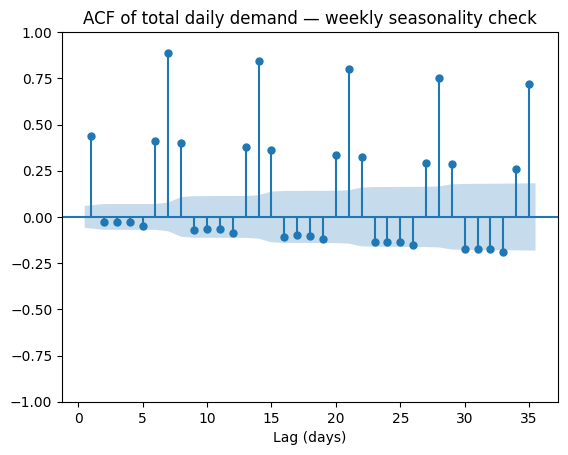

Lag   1: 0.441
Lag   7: 0.894
Lag  14: 0.854
Lag  21: 0.816
Lag  28: 0.772
Lag  30: -0.181
Lag  90: 0.049
Lag 180: -0.203
Lag 364: 0.917
Lag 365: 0.441
Lag 366: -0.031


In [43]:
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

plot_acf(daily['units_sold'], lags=35, zero=False)
plt.title("ACF of total daily demand — weekly seasonality check")
plt.xlabel("Lag (days)")
plt.show()

for lag in [1,7,14,21,28,30,90,180,364,365,366]:
    print(f"Lag {lag:3d}: {daily['units_sold'].autocorr(lag=lag):.3f}")

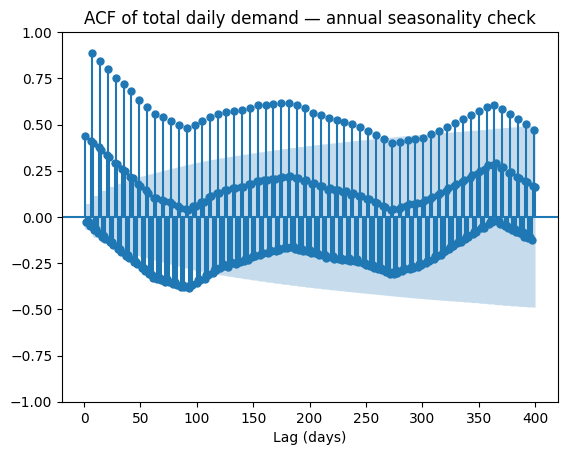

Lag   1: 0.441
Lag   7: 0.894
Lag  14: 0.854
Lag  21: 0.816
Lag  28: 0.772
Lag  30: -0.181
Lag  90: 0.049
Lag 180: -0.203
Lag 364: 0.917
Lag 365: 0.441
Lag 366: -0.031


In [45]:
plot_acf(daily['units_sold'], lags=400, zero=False)
plt.title("ACF of total daily demand — annual seasonality check")
plt.xlabel("Lag (days)")
plt.show()

for lag in [1,7,14,21,28,30,90,180,364,365,366]:
    print(f"Lag {lag:3d}: {daily['units_sold'].autocorr(lag=lag):.3f}")

In [26]:
dow=(df.groupby(["weekday","category"],as_index=False).units_sold.mean())
px.line(dow,x="weekday",y="units_sold",color="category",markers=True,title="Mean demand by weekday and category").show()
month=(df.groupby(["month","channel"],as_index=False).units_sold.mean())
px.line(month,x="month",y="units_sold",color="channel",markers=True,title="Mean demand by month and channel").show()

In [ ]:
# For all the units summed up, we see higher values in weekends (sat and sun)
# And for certain months (Jun to Aug) and (Oct to Dec)

In [46]:
year_month = df.groupby(['year','month'],as_index=False).units_sold.mean()
px.line(year_month,x='month',y='units_sold',color='year',markers=True,title='Monthly demand pattern by year').show()

In [ ]:
# This confirms that the pattern is consistent for all the years

In [27]:
# Simple autocorrelation of aggregate daily demand; peaks at 7/14/21/28 suggest weekly recurrence.
y=daily.set_index("date").units_sold
acf=pd.DataFrame({"lag":range(1,57),"corr":[y.corr(y.shift(k)) for k in range(1,57)]})
px.bar(acf,x="lag",y="corr",title="Aggregate demand autocorrelation, lags 1..56").show()

**Decision impact.** Weekly recurrence justifies lags 7/14/28 and 7/14/28-day rolling features. Cyclical calendar encodings help models represent periodic positions smoothly. Deep models receive calendar signals directly as known-future covariates.

## 5. Interactive series trend examples

In [28]:
# It calculates total sales over the entire three years for every Store-SKU pair and selects the 12 highest-volume Store-SKU series.
# Plotting the 28 days rolling/moving avg for each Store-SKU series

top_pairs=(df.groupby(["store_id","sku_id"],as_index=False).units_sold.sum().nlargest(12,"units_sold")[["store_id","sku_id"]])
sample=df.merge(top_pairs,on=["store_id","sku_id"]).copy()
sample["series"]=sample.store_id+" | "+sample.sku_id
sample["roll28"]=sample.groupby("series").units_sold.transform(lambda s:s.rolling(28,min_periods=7).mean())
fig=px.line(sample,x="date",y="roll28",color="series",title="28-day rolling demand for highest-volume series")
fig.show()

In [ ]:
# The 12 highest-volume Store-SKU series exhibit strong and broadly synchronized temporal patterns. 
# In particular, elevated demand during the middle of each year followed by a pronounced decline around early autumn repeats across 2021–2023 for most selected series. 
# This indicates that the annual seasonal pattern observed in aggregate demand is also present at the individual Store-SKU level for high-volume series. 
# The common timing but differing magnitude of seasonal changes suggests shared seasonal structure with series-specific responses, 
# supporting the use of a global Store-SKU forecasting model. However, because the analysis intentionally selects high-volume series, 
# the finding should not yet be generalized to all Store-SKU combinations.

**Decision impact.** If different series show distinct levels/trends but common calendar responses, shared-weight/global models are attractive. If a subset exhibits fundamentally different residual patterns, per-subcategory models become a testable challenger.

## 6. Promotion lift and discount depth

In [29]:
promo_summary=(df.groupby(["category","promo_flag"]).units_sold.agg(["mean","median","count"]).reset_index())
px.bar(promo_summary,x="category",y="mean",color="promo_flag",barmode="group",title="Descriptive promo vs non-promo mean demand").show()

base=(df.groupby(["category","promo_flag"]).units_sold.mean().unstack())
base["descriptive_lift_pct"]=(base.get(1)/base.get(0)-1)*100
display(base)

promo_flag,0,1,descriptive_lift_pct
category,,,
Beverages,61.993670,127.013250,104.880998
Dairy,50.238388,82.136479,63.493461
Home Care,48.496828,112.185753,131.325963
Personal Care,51.527859,86.139269,67.170285
Snacks,59.970417,100.170472,67.033142


In [30]:
bins=[-0.001,0.001,0.10,0.20,0.30,1.0]
labels=["0%","(0,10%]","(10,20%]","(20,30%]",">30%"]
tmp=df.copy(); tmp["discount_band"]=pd.cut(tmp.discount_pct,bins=bins,labels=labels,include_lowest=True)
disc=tmp.groupby(["discount_band","category"],observed=True,as_index=False).units_sold.mean()
px.line(disc,x="discount_band",y="units_sold",color="category",markers=True,title="Demand by discount band (descriptive, not causal)").show()

In [ ]:
# Promotion and discount: Promotional observations exhibit substantially higher average demand than non-promotional observations across all product categories, 
# with descriptive uplift ranging from approximately 63% to 131%. The magnitude of the association differs by category, 
# with Home Care and Beverages showing particularly large differences. Similarly, average demand increases monotonically across higher discount bands for all categories, 
# indicating a strong positive association between discount depth and units sold. 
# These relationships are descriptive rather than causal because promotion and discount assignment may be correlated with SKU characteristics, seasonality, holidays, 
# and expected demand. Nevertheless, if promotion and discount schedules are known in advance, both represent potentially important future covariates for demand forecasting.

**Decision impact.** Promo and discount must be known-future features. Rare promo days deserve a dedicated error slice because a low overall WAPE can hide large promo failures. Raw promo lift is observational, not a causal treatment effect.

## 7. Stockouts: censored demand diagnostic

In [31]:
print("Stockout row rate:", df.stock_out_flag.mean())
so=(df.groupby(["stock_out_flag","category"]).units_sold.agg(["mean","median","count"]).reset_index())
px.bar(so,x="category",y="mean",color="stock_out_flag",barmode="group",title="Observed sales on stockout vs non-stockout days").show()
display(so)

Stockout row rate: 0.030103636363636364


,stock_out_flag,category,mean,median,count
0,0,Beverages,69.687970,57.0,258030
1,0,Dairy,53.449477,45.0,190179
2,0,Home Care,53.748351,44.0,171604
3,0,Personal Care,55.533414,45.0,193317
4,0,Snacks,65.509107,57.0,253756
5,1,Beverages,13.507014,9.0,8055
6,1,Dairy,10.167182,7.0,5826
7,1,Home Care,10.125777,7.0,5311
8,1,Personal Care,10.719404,7.0,5973
9,1,Snacks,12.740596,9.0,7949


In [32]:
# Compare a stockout day's observed demand with prior 28-day non-stockout median for diagnostics.
tmp=df[["date","store_id","sku_id","units_sold","stock_out_flag"]].copy()
nonstock=tmp.units_sold.where(tmp.stock_out_flag.eq(0))
tmp["prior_nonstock_median_28"]=(nonstock.groupby([tmp.store_id,tmp.sku_id],sort=False)
    .transform(lambda s:s.shift(1).rolling(28,min_periods=7).median()))
stock_rows=tmp[tmp.stock_out_flag.eq(1)].dropna(subset=["prior_nonstock_median_28"]).copy()
stock_rows["observed_vs_prior_ratio"]=stock_rows.units_sold/stock_rows.prior_nonstock_median_28.replace(0,np.nan)
display(stock_rows.observed_vs_prior_ratio.describe(percentiles=[.1,.25,.5,.75,.9]))

count    32894.000000
mean         0.196772
std          0.154055
min          0.000000
10%          0.020000
25%          0.076923
50%          0.171429
75%          0.285714
90%          0.400000
max          1.597765
Name: observed_vs_prior_ratio, dtype: float64

**Decision impact.** `stock_out_flag=1` identifies potentially censored labels. The production feature pipeline replaces stockout targets conservatively with the maximum of observed sales and a prior non-stockout rolling baseline, then downweights those imputed labels. Future stockout flags are never used because they are outcomes, not known inputs.

## 8. Price dynamics and weather

In [33]:
px.scatter(df.sample(min(100_000,len(df)),random_state=42),x="discount_pct",y="units_sold",color="promo_flag",
           facet_col="category",facet_col_wrap=3,opacity=.25,title="Demand vs discount (sample)").show()

In [34]:
weather=df.groupby(pd.cut(df.temperature,10),observed=True).units_sold.mean().reset_index()
weather["temperature_band"]=weather.temperature.astype(str)
px.bar(weather,x="temperature_band",y="units_sold",title="Descriptive demand by temperature band").show()

**Decision impact.** Same-day/future price and weather are legal only if they are genuinely available for the entire 14-day horizon at forecast creation. In production the training contract must match the inference contract; otherwise these columns must be replaced by planned price/weather forecasts or removed.

## 9. Sparse, zero-demand and cold-start diagnostics

In [35]:
pairs2=(df.groupby(["store_id","sku_id"]).agg(
    n=("date","size"), zero_rate=("units_sold",lambda s:(s==0).mean()),
    first=("date","min"), last=("date","max"), mean_units=("units_sold","mean")
).reset_index())
print("Pairs <= 60 days:", (pairs2.n<=60).sum())
print("Pairs <= 180 days:", (pairs2.n<=180).sum())
print("Pairs > 50% zero demand:", (pairs2.zero_rate>.5).sum())
display(pairs2.sort_values(["n","zero_rate"]).head(20))

Pairs <= 60 days: 0
Pairs <= 180 days: 0
Pairs > 50% zero demand: 0


,store_id,sku_id,n,zero_rate,first,last,mean_units
992,STORE0013,SKU0073,620,0.009677,2021-01-01,2022-09-12,5.667742
0,STORE0001,SKU0001,1095,0.000000,2021-01-01,2023-12-31,146.420091
8,STORE0001,SKU0012,1095,0.000000,2021-01-01,2023-12-31,61.628311
9,STORE0001,SKU0014,1095,0.000000,2021-01-01,2023-12-31,70.747032
12,STORE0001,SKU0017,1095,0.000000,2021-01-01,2023-12-31,147.589954
13,STORE0001,SKU0018,1095,0.000000,2021-01-01,2023-12-31,107.274886
27,STORE0001,SKU0037,1095,0.000000,2021-01-01,2023-12-31,99.394521
36,STORE0001,SKU0047,1095,0.000000,2021-01-01,2023-12-31,72.401826
47,STORE0001,SKU0060,1095,0.000000,2021-01-01,2023-12-31,65.639269
63,STORE0001,SKU0080,1095,0.000000,2021-01-01,2023-12-31,102.982648


**Decision impact.** The assignment dataset itself has little cold-start pressure, but a production design still needs it. Route short-history/new IDs to the global model using hierarchy/static features and unknown-ID embeddings; use subcategory/store priors or middle-out allocation as fallback. Do not depend on local models for new products.

## 10. Leakage-safe train/validation/test split

In [36]:
H=14
max_date=df.date.max().normalize()
test_end=max_date; test_start=test_end-pd.Timedelta(days=H-1)
val_end=test_start-pd.Timedelta(days=1); val_start=val_end-pd.Timedelta(days=H-1)
train_end=val_start-pd.Timedelta(days=1)
print(f"TRAIN: {df.date.min().date()} -> {train_end.date()}")
print(f"VAL  : {val_start.date()} -> {val_end.date()} ({(val_end-val_start).days+1} days)")
print(f"TEST : {test_start.date()} -> {test_end.date()} ({(test_end-test_start).days+1} days)")

plot=daily.copy(); plot["split"]=np.select([plot.date<=train_end,plot.date<=val_end],["train","validation"],default="test")
px.line(plot,x="date",y="units_sold",color="split",title="Temporal split - no random row shuffle").show()

TRAIN: 2021-01-01 -> 2023-12-03
VAL  : 2023-12-04 -> 2023-12-17 (14 days)
TEST : 2023-12-18 -> 2023-12-31 (14 days)


### Why this split is leakage-safe

- Validation and test are exactly 14 days, matching the deployment horizon.
- Hyperparameters/features/model family are chosen on validation, not test.
- The final test remains untouched until selection is frozen.
- **Critical:** do not compute validation/test lag features from true labels inside the same 14-day horizon. For tree models, forecast recursively from the origin and feed predictions back into demand lags. For the LSTM/Transformer, the 14 future targets are never part of the input.

For a stronger production estimate, add multiple rolling-origin validation folds before this final holdout.

## 11. Global vs segmented/local vs hierarchy strategy summary

In [37]:
strategy=pd.DataFrame([
    ["Global store-SKU",1,"Maximum sharing; one artifact; best cold-start behavior","Can underfit special regimes","Primary baseline / likely v1"],
    ["Per subcategory",df.subcategory.nunique(),"Specialized dynamics; manageable model count","Less sharing","Benchmark if residuals cluster by subcategory"],
    ["Per SKU across stores",df.sku_id.nunique(),"SKU-specific patterns; shares across stores","~100 artifacts; weak new-SKU handling","Secondary benchmark"],
    ["Local store-SKU",pairs.shape[0],"Maximum local specialization","~1000 models; no sharing; operational burden","Benchmark only, not default"],
    ["Bottom-up",pairs[pairs.end==df.date.max()].shape[0],"Exact coherent aggregation from required bottom forecasts","Parent accuracy inherits child noise","Recommended hierarchy v1"],
    ["Middle-out",df[["store_id","subcategory"]].drop_duplicates().shape[0],"Stable middle totals; fewer forecasting units","Allocation share can miss new/promo SKUs","Challenger for noisy SKU groups"],
],columns=["strategy","approx_model_or_series_count","strength","weakness","recommendation"])
display(strategy)

,strategy,approx_model_or_series_count,strength,weakness,recommendation
0,Global store-SKU,1,Maximum sharing; one artifact; best cold-start...,Can underfit special regimes,Primary baseline / likely v1
1,Per subcategory,17,Specialized dynamics; manageable model count,Less sharing,Benchmark if residuals cluster by subcategory
2,Per SKU across stores,102,SKU-specific patterns; shares across stores,~100 artifacts; weak new-SKU handling,Secondary benchmark
3,Local store-SKU,1005,Maximum local specialization,~1000 models; no sharing; operational burden,"Benchmark only, not default"
4,Bottom-up,1004,Exact coherent aggregation from required botto...,Parent accuracy inherits child noise,Recommended hierarchy v1
5,Middle-out,220,Stable middle totals; fewer forecasting units,Allocation share can miss new/promo SKUs,Challenger for noisy SKU groups


## 12. What to run next

1. Create point-in-time features with `prepare_dataset.py`.
2. Run Bayesian tuning for LightGBM/XGBoost/CatBoost on the 14-day validation origin.
3. Evaluate channel/category/promo/horizon failures.
4. Train the global LSTM and Transformer challengers.
5. Compare validation performance and operational cost; only then inspect the untouched test.
6. Aggregate bottom-level predictions to parent levels and compare bottom-up parent accuracy; test middle-out only where needed.

See `../explanation.md` for the detailed production rationale and exact code mapping.